In [1]:
import os
import glob
import zipfile
import numpy as np
import pandas as pd
from tqdm import tqdm
from sentence_transformers import util
from umap import UMAP
from hdbscan import HDBSCAN
import sys
# caution: path[0] is reserved for script path (or '' in REPL)
sys.path.insert(1, '../src/')

# Flickr 8k images
img_folder = '../../photos/'
caps_folder = '../../captions/'
if not os.path.exists(img_folder) or len(os.listdir(img_folder)) == 0:
    os.makedirs(img_folder, exist_ok=True)

    if not os.path.exists('Flickr8k_Dataset.zip'):   #Download dataset if does not exist
        util.http_get('https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip', 'Flickr8k_Dataset.zip')
        util.http_get('https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip', 'Flickr8k_text.zip')

    for folder, file in [(img_folder, 'Flickr8k_Dataset.zip'), (caps_folder, 'Flickr8k_text.zip')]:
        with zipfile.ZipFile(file, 'r') as zf:
            for member in tqdm(zf.infolist(), desc='Extracting'):
                zf.extract(member, folder)
images = list(glob.glob(f'{img_folder}Flicker8k_Dataset/*.jpg'))

/ext3/miniconda3/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
2024-04-28 15:22:53,003 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-04-28 15:22:53,004 - BERTopic - Dimensionality - Completed ✓
2024-04-28 15:22:53,004 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-04-28 15:22:53,426 - BERTopic - Cluster - Completed ✓
2024-04-28 15:22:53,575 

,Topic,Count,Name,Representation,Visual_Aspect,Representative_Docs
0,-1,80,-1_game_being_football_played,"[game, being, football, played, soccer, profes...",<PIL.Image.Image image mode=RGB size=900x600 a...,"[a professional soccer game being played , a p..."
1,0,5944,0_is_the_in_air,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p..."
2,1,2067,1_dog_running_in_field,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...


,Topic,Count,Representation,Visual_Aspect
0,-1,80,"[game, being, football, played, soccer, professional, of, baseball, field, on]",
1,0,5944,"[is, the, in, air, skateboard, jumping, with, on, man, person]",
2,1,2067,"[dog, running, in, field, grass, with, frisbee, the, its, mouth]",

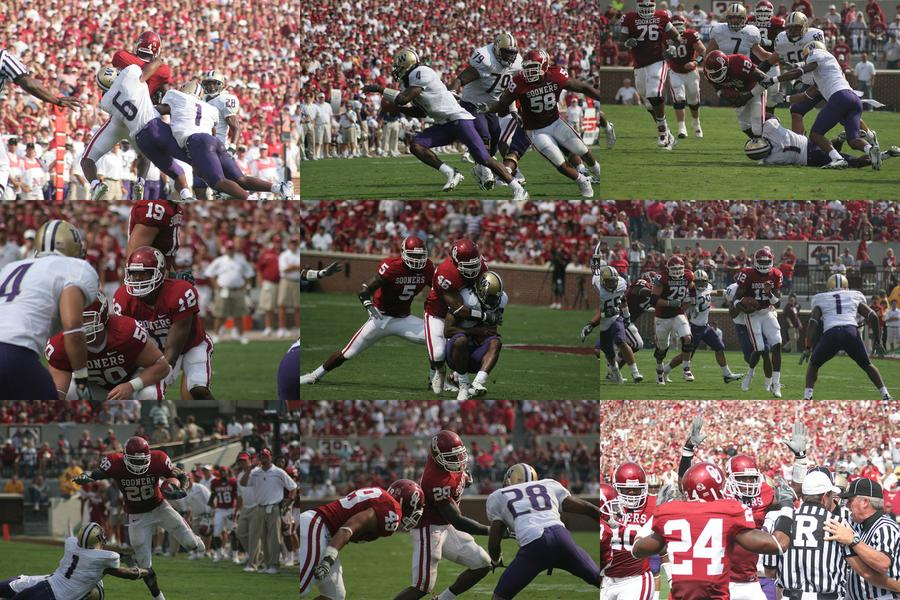
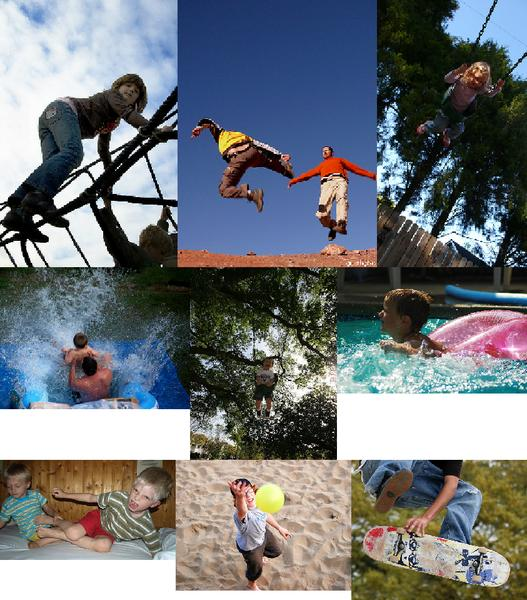
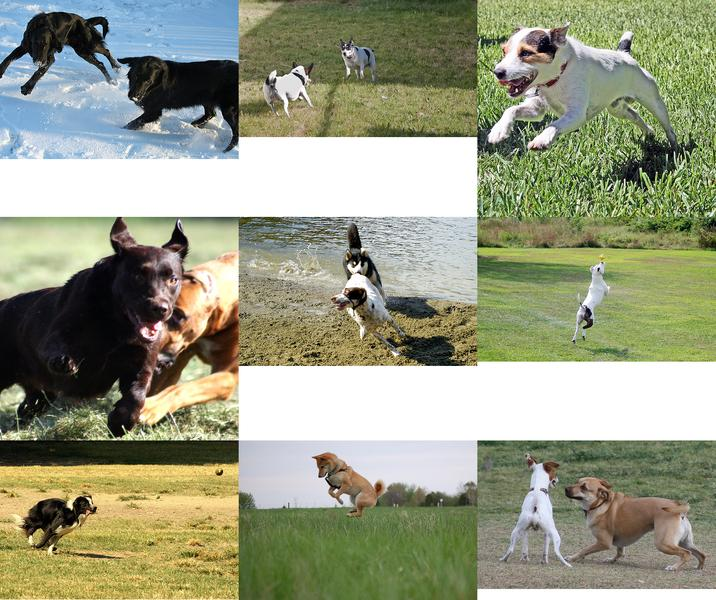

In [2]:
from utils import Image_Topic_Extractor
load_folder = '../../saved_embeddings/'
# In onder to run without precomputed embeddings, just don't pass this parameters
topic_extractor = Image_Topic_Extractor(img_list = images,
                 clusters = load_folder + 'clusters.npy' ,
                 embeddings = load_folder + 'embeddings.npy',
                 reduced_embeddings = load_folder + 'reduced_embeddings.npy',
                 reduced_embeddings_2d = load_folder + '2d_embeddings.npy',)

topic_extractor.fit()
df = topic_extractor.get_topic_info()
display(df)
topic_extractor.display_topic_info_images()

## Visualizations

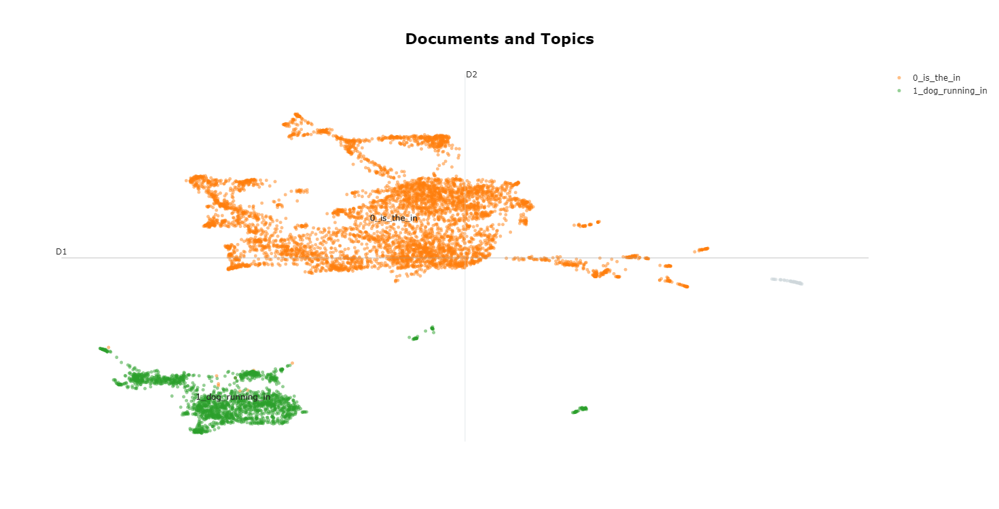

In [18]:
topic_extractor.visualize_2d_clusters(hide_document_hover = True)

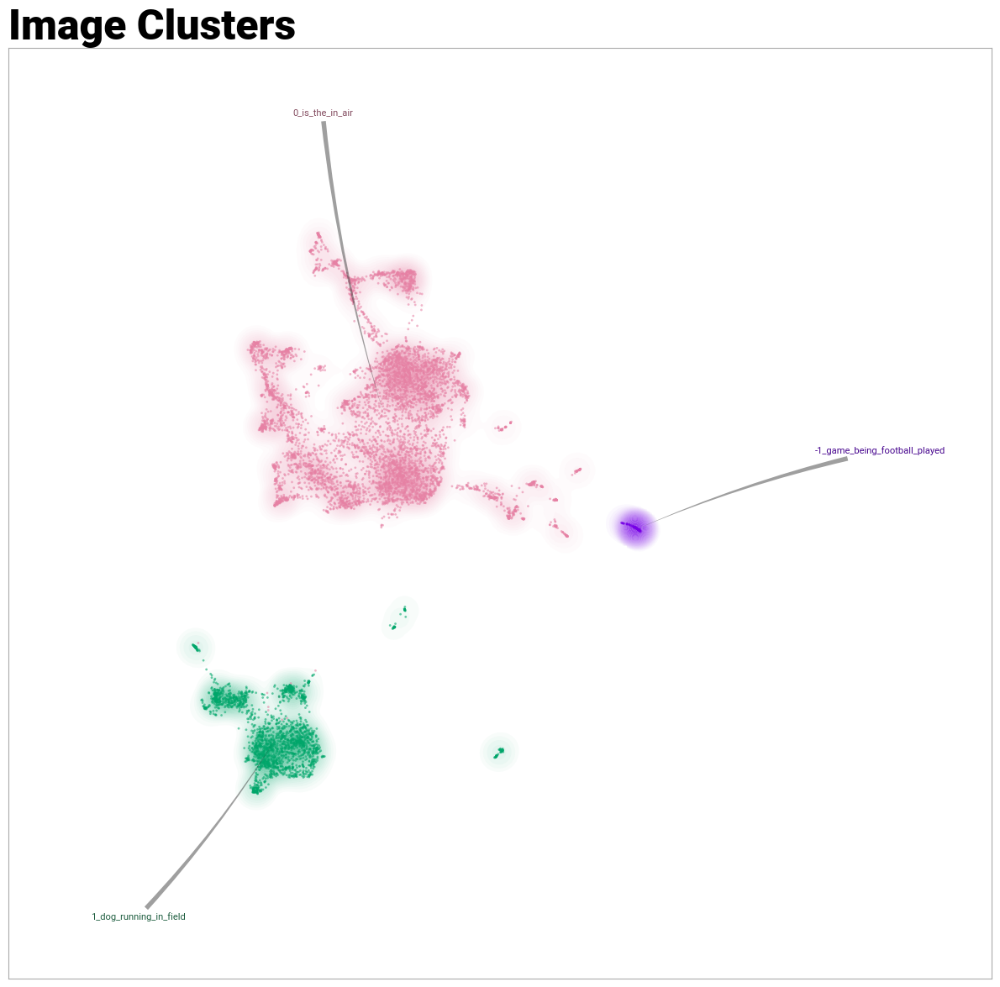

In [19]:
topic_extractor.datamap_plot()


## Retrieving the classification per image

In [21]:
document_df = topic_extractor.get_document_info()
display(document_df)

,Document,Topic,Name,Representation,Visual_Aspect,Representative_Docs,Top_n_words,Representative_document
0,../../photos/Flicker8k_Dataset/69710415_5c2bfb...,0,0_is_the_in_air,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,False
1,../../photos/Flicker8k_Dataset/3044359043_6274...,1,1_dog_running_in_field,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...,dog - running - in - field - grass - with - fr...,False
2,../../photos/Flicker8k_Dataset/1386964743_9e80...,0,0_is_the_in_air,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,False
3,../../photos/Flicker8k_Dataset/3523559027_a656...,0,0_is_the_in_air,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,False
4,../../photos/Flicker8k_Dataset/2632381125_de32...,1,1_dog_running_in_field,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...,dog - running - in - field - grass - with - fr...,False
...,...,...,...,...,...,...,...,...
8086,../../photos/Flicker8k_Dataset/3380364224_2626...,0,0_is_the_in_air,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,False
8087,../../photos/Flicker8k_Dataset/2857558098_98e9...,1,1_dog_running_in_field,"[dog, running, in, field, grass, with, frisbee...",<PIL.Image.Image image mode=RGB size=716x600 a...,[a dog and a brown dog are playing in the gras...,dog - running - in - field - grass - with - fr...,False
8088,../../photos/Flicker8k_Dataset/2930580341_d36e...,0,0_is_the_in_air,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,False
8089,../../photos/Flicker8k_Dataset/3165826902_6bf9...,0,0_is_the_in_air,"[is, the, in, air, skateboard, jumping, with, ...",<PIL.Image.Image image mode=RGB size=527x600 a...,"[a man jumping in the air with a frisbee , a p...",is - the - in - air - skateboard - jumping - w...,False


## Custom min_cluster_size

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
2024-04-28 14:42:46,323 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-04-28 14:42:46,323 - BERTopic - Dimensionality - Completed ✓
2024-04-28 14:42:46,324 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-04-28 14:42:46,690 - BERTopic - Cluster - Completed ✓
2024-04-28 14:42:46,693 - BERTopic - Images - Converting images to text. This might take a while.
100%|██████████| 98/98 [09:07<00:00,  5.59s/it]
2024-04-28 14:51:54,372 - BERTopic - Images - Completed ✓
100%|██████████| 98/98 [00:33<00:00,  2.91it/s]


,Topic,Count,Name,Representation,Visual_Aspect,Representative_Docs
0,-1,2553,-1_wooden_pole_rail_hand,"[wooden, pole, rail, hand, playing, frisbee, b...",<PIL.Image.Image image mode=RGB size=530x600 a...,[a young boy holding a baseball bat in his han...
1,0,1188,0_grassy_running_grass_field,"[grassy, running, grass, field, dog, across, t...",<PIL.Image.Image image mode=RGB size=717x600 a...,"[a black dog running through a grassy field , ..."
2,1,301,1_frisbee_dog_running_water,"[frisbee, dog, running, water, the, its, catch...",<PIL.Image.Image image mode=RGB size=657x600 a...,"[a dog running in the water with a frisbee , a..."
3,2,300,2_doing_ramp_trick_cement,"[doing, ramp, trick, cement, skateboarder, ska...",<PIL.Image.Image image mode=RGB size=423x600 a...,"[a man on a skateboard doing a trick , a skate..."
4,3,190,3_mountain_range_slope_snowboard,"[mountain, range, slope, snowboard, covered, b...",<PIL.Image.Image image mode=RGB size=735x600 a...,"[a person on a snowboard on a mountain , a man..."
...,...,...,...,...,...,...
93,92,10,92_dressed_costume_costumes_full,"[dressed, costume, costumes, full, basket, str...",<PIL.Image.Image image mode=RGB size=498x600 a...,"[a parade of people dressed in costumes , a wo..."
94,93,10,93_path_branch_near_perched,"[path, branch, near, perched, sun, ledge, cat,...",<PIL.Image.Image image mode=RGB size=478x600 a...,"[a bird is perched on a tree branch , a dog is..."
95,94,10,94_rock_climbing_up_wall,"[rock, climbing, up, wall, cliff, mountain, pe...",<PIL.Image.Image image mode=RGB size=514x600 a...,"[a person on a rock climbing up a hill , a man..."
96,95,10,95_park_trying_teach_play,"[park, trying, teach, play, how, kite, tent, c...",<PIL.Image.Image image mode=RGB size=781x600 a...,"[a boy is playing with a frisbee in a park , a..."


,Topic,Count,Representation,Visual_Aspect
0,-1,2553,"[wooden, pole, rail, hand, playing, frisbee, boys, grass, bed, boy]",
1,0,1188,"[grassy, running, grass, field, dog, across, through, brown, its, cat]",
2,1,301,"[frisbee, dog, running, water, the, its, catch, mouth, air, with]",
3,2,300,"[doing, ramp, trick, cement, skateboarder, skateboard, wall, top, riding, on]",
4,3,190,"[mountain, range, slope, snowboard, covered, backpack, skis, top, jacket, person]",
5,4,185,"[pool, boogie, water, toy, blue, boy, ball, baby, laying, pink]",
6,5,142,"[snowboarder, jump, mid, skier, slope, going, after, doing, air, trick]",
7,6,127,"[trail, bike, riding, down, person, hill, dirt, top, rock, man]",
8,7,101,"[crib, laying, animal, stuffed, something, floor, bed, baby, eating, toy]",
9,8,99,"[through, snow, stick, its, dog, running, tongue, covered, fighting, ground]",

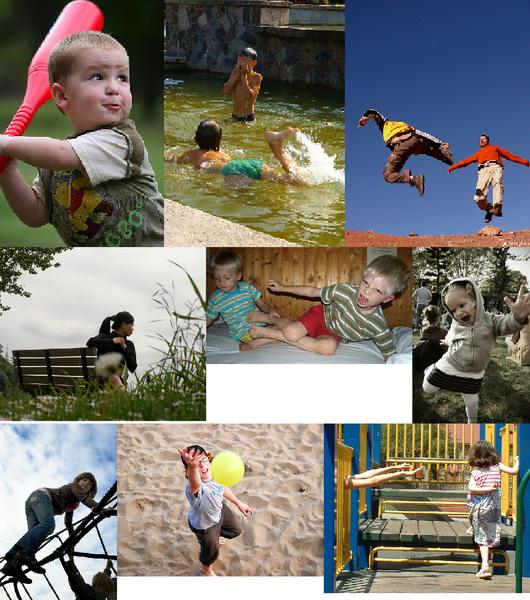
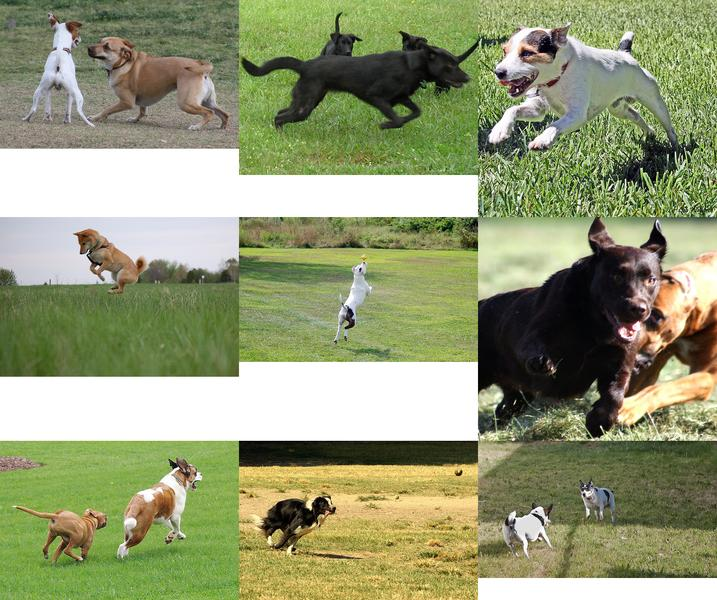
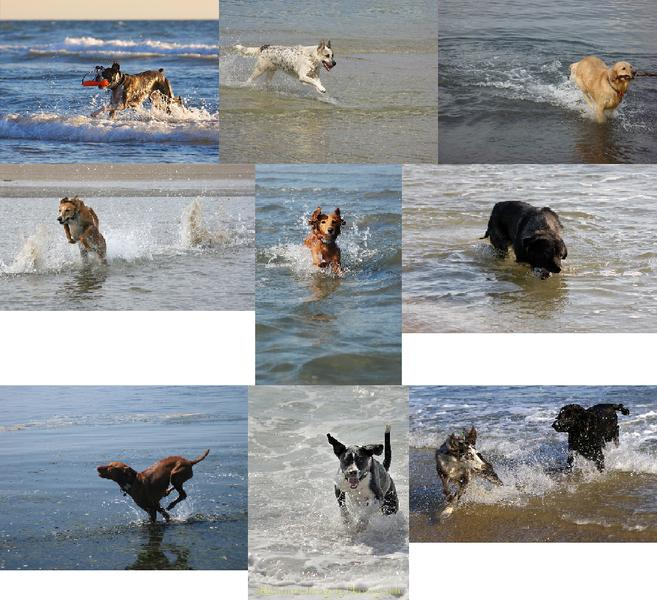
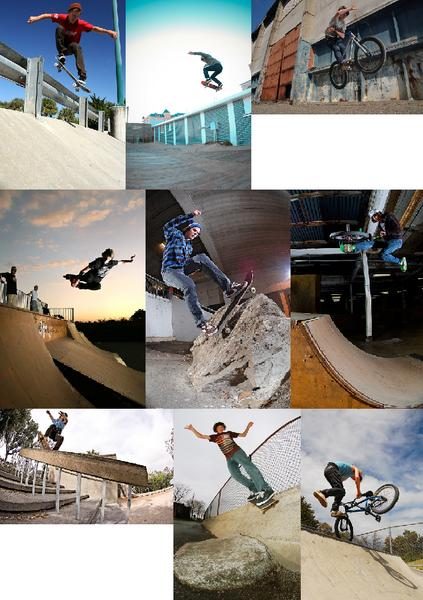
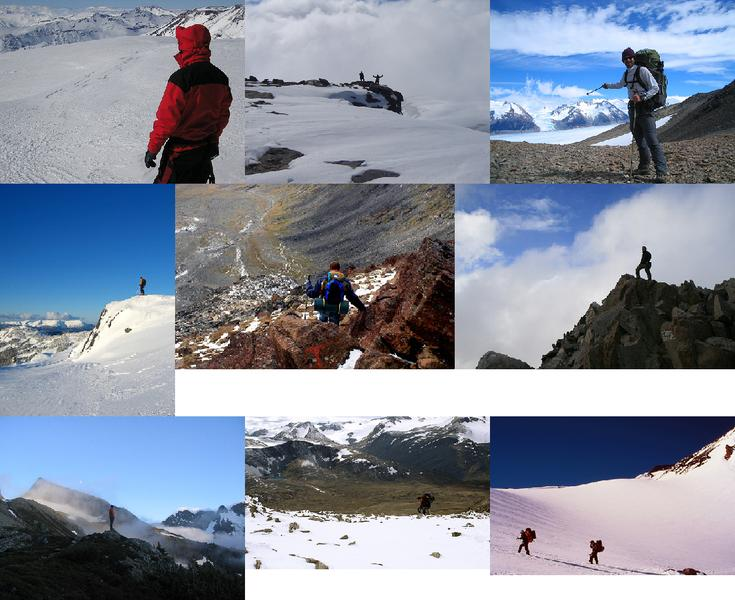
...
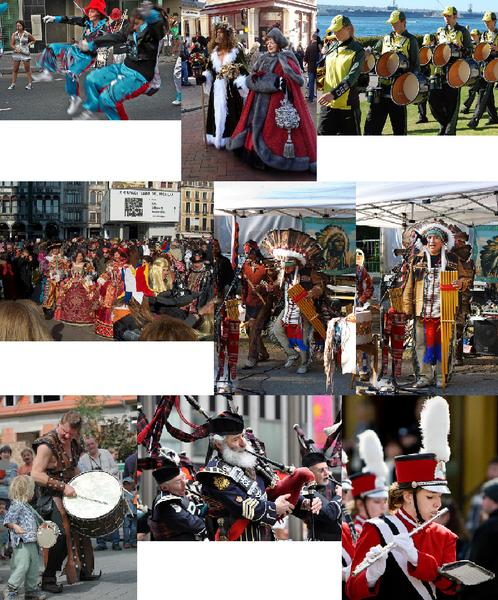
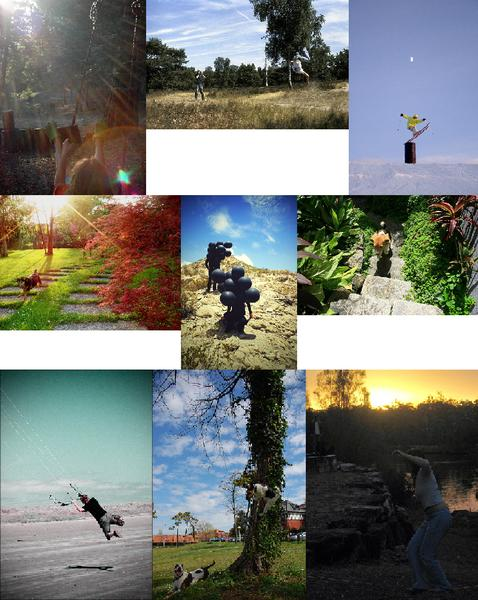
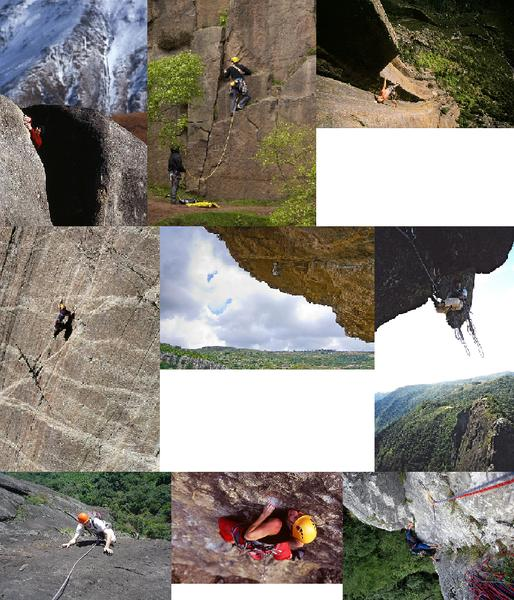
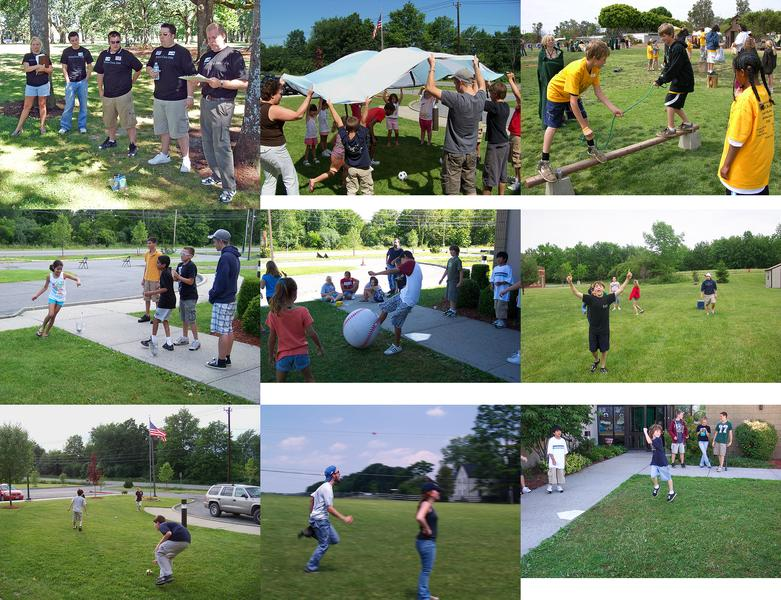
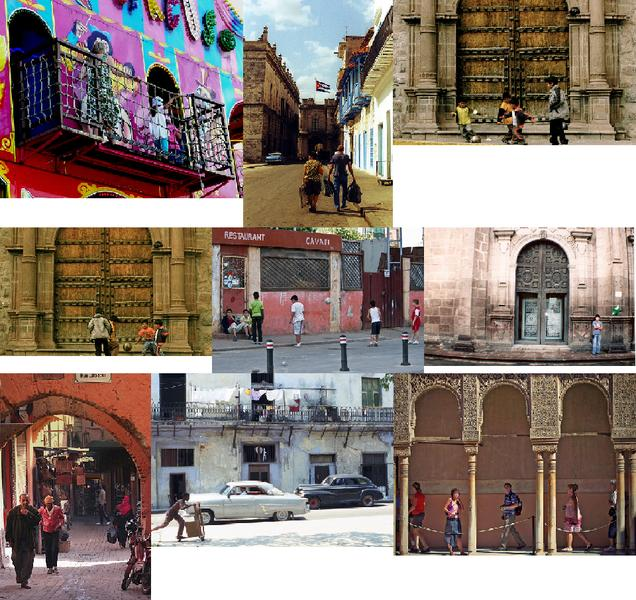

In [5]:
#Changing the Cluster step
load_folder = '../../saved_embeddings/'
topic_extractor = Image_Topic_Extractor(img_list = images,
                 embeddings = load_folder + 'embeddings.npy',
                 reduced_embeddings = load_folder + 'reduced_embeddings.npy',
                 reduced_embeddings_2d = load_folder + '2d_embeddings.npy',
                 Dimensionality_reductor =  HDBSCAN(min_cluster_size=30, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
                )

topic_extractor.fit()
df = topic_extractor.get_topic_info()
display(df)
topic_extractor.display_topic_info_images()


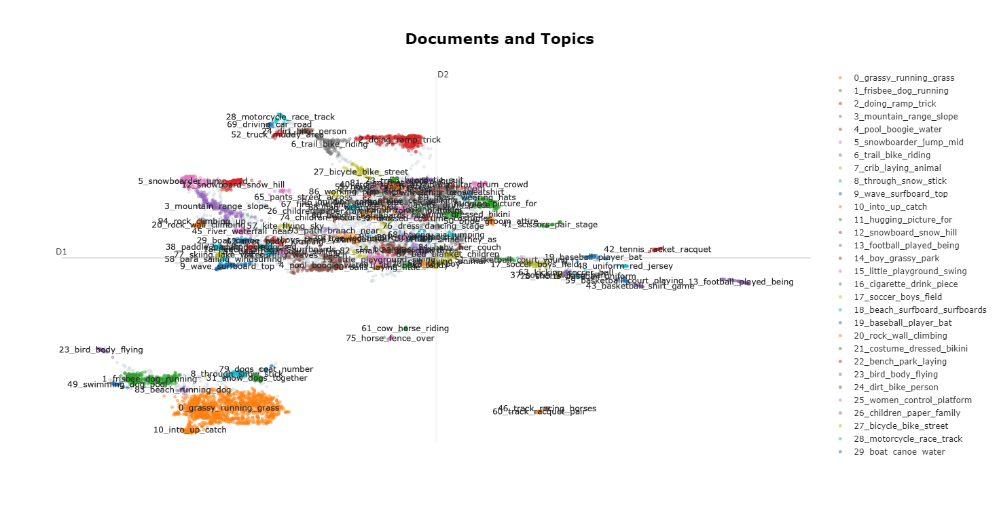

In [6]:
topic_extractor.visualize_2d_clusters(hide_document_hover = True)

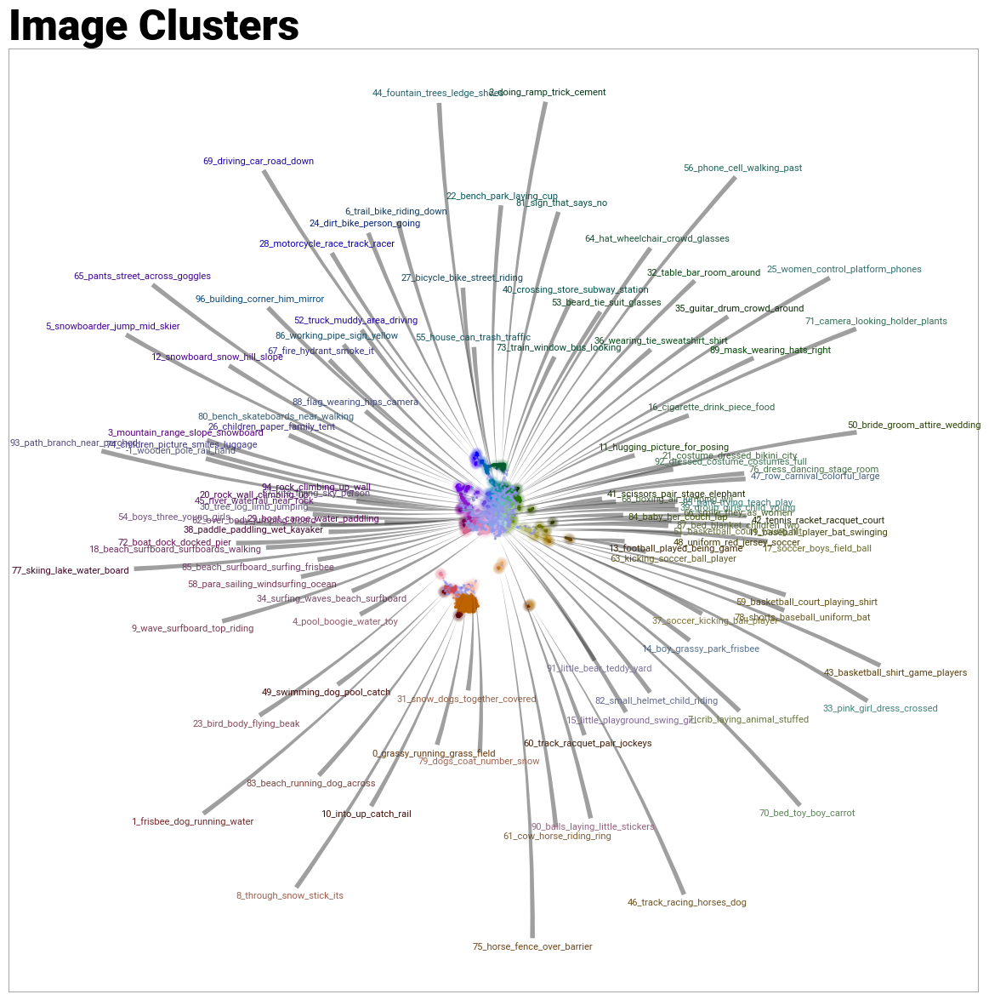

In [7]:
# Run the visualization
topic_extractor.datamap_plot()


